In [50]:
# Import necessary libraries and modules
import sys
import os
sys.path.append('../src')  # Add src folder to the Python path
import json
import numpy as np
from datasets import Dataset
from data_processing.preprocessing import get_dataset

train_dataset , val_dataset = get_dataset('train', True)

# Test set
test_dataset = get_dataset('val')

# Describe dataset 

In [51]:
from collections import Counter
import pandas as pd
from datasets import concatenate_datasets

# Combine train and val datasets
combined_dataset = concatenate_datasets([train_dataset, val_dataset])

# Count the number of samples
n_samples_combined = len(combined_dataset)
n_samples_test = len(test_dataset)

# Calculate class balance for combined dataset
class_counts_combined = Counter(combined_dataset['label'])
class_balance_combined = {label: count / n_samples_combined for label, count in class_counts_combined.items()}

# Calculate class balance for test dataset
class_counts_test = Counter(test_dataset['label'])
class_balance_test = {label: count / n_samples_test for label, count in class_counts_test.items()}

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Dataset': ['Train + Val', 'Test'],
    'n_samples': [n_samples_combined, n_samples_test],
    'Class Balance': [class_balance_combined, class_balance_test]
})

# Display the summary
print(summary_df)

       Dataset  n_samples                                   Class Balance
0  Train + Val      50337  {1: 0.2981107336551642, 0: 0.7018892663448358}
1         Test      14378  {0: 0.713381555153707, 1: 0.28661844484629295}


In [52]:
import pandas as pd

# Assuming `df` is your dataset with the columns ['input', 'response', 'full_sentence', 'label']

# Step 1: Filter for input-output pairs
filtered_df = df[['input', 'response', 'full_sentence', 'label']]

# Step 2: Group by the `response` column (or the identifier for the output)
grouped = filtered_df.groupby('response')

# Step 3: Assign group-level labels
def assign_group_label(group):
    # If any full_sentence in the group has a label of 1, assign label 1 to the entire group
    group_label = 1 if group['label'].max() == 1 else 0
    group['group_label'] = group_label
    return group

processed_groups = grouped.apply(assign_group_label)

# Step 4: Drop duplicates to keep one row per `response` (output)
final_df = processed_groups.drop_duplicates(subset=['response']).reset_index(drop=True)

# Final dataset with input-output pairs and group-level labels
print(final_df.head())


                                               input  \
0  Give a detailed description of the image.Write...   
1  Give a detailed description of the image.Write...   
2  Give a detailed description of the image.Write...   
3  Give a detailed description of the image.Write...   
4  Give a detailed description of the image.Write...   

                                            response  \
0  A black cat is standing next to a parked motor...   
1  A group of people is standing in front of a ho...   
2  A lively scene is captured in the image, featu...   
3  A lively scene unfolds in a large grassy field...   
4  A man in a wetsuit is riding a surfboard on a ...   

                                       full_sentence  label  group_label  
0  The motorcycle is positioned towards the left ...      0            1  
1  In addition to the backpacks, there are severa...      1            1  
2  In addition to the cars, there are a few peopl...      1            1  
3  Overall, the image capt

/tmp/ipykernel_2964291/1134488505.py:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  processed_groups = grouped.apply(assign_group_label)


# Prompt - label correlation analysis

In [53]:
from scipy.stats import chi2_contingency

# Create a contingency table (rows: prompts, columns: labels)
contingency_table = pd.crosstab(final_df['input'], final_df['label'])

# Perform the Chi-Square test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Statistic: {chi2}")
print(f"P-Value: {p}")

# Interpretation
if p < 0.05:
    print("There is a significant association between prompts and labels.")
else:
    print("No significant association between prompts and labels.")


Chi-Square Statistic: 716.6577091198952
P-Value: 1.652978530732375e-140
There is a significant association between prompts and labels.


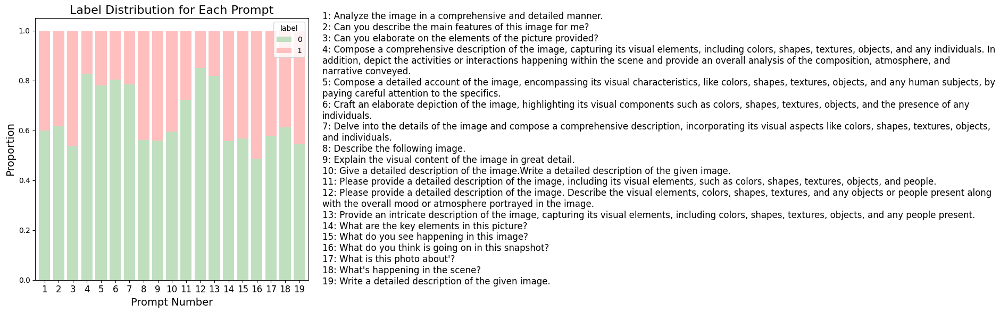

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap

# Assuming prompt_label_distribution is already computed
prompt_label_distribution = final_df.groupby('input')['label'].value_counts(normalize=True).unstack()

# Map prompts to numeric values
prompt_mapping = {prompt: idx + 1 for idx, prompt in enumerate(prompt_label_distribution.index)}
numeric_x = [prompt_mapping[prompt] for prompt in prompt_label_distribution.index]

# Wrap prompt text to fit narrower space
wrapped_prompts = {num: "\n".join(wrap(text, width=150)) for text, num in prompt_mapping.items()}

# Define custom colors for the bars
custom_colors = ['#bfdfbf', '#ffbfbf']  # Green and Red from the provided image

# Plot the data
fig, ax = plt.subplots(figsize=(12, 6))

# Plot stacked bar chart with numeric x-axis and custom colors
prompt_label_distribution.index = numeric_x
prompt_label_distribution.plot(kind='bar', stacked=True, color=custom_colors, ax=ax, width=0.8)

# Update axis labels and title
ax.set_xticklabels(numeric_x, rotation=0, fontsize=12)
ax.set_title('Label Distribution for Each Prompt', fontsize=16)
ax.set_xlabel('Prompt Number', fontsize=14)
ax.set_ylabel('Proportion', fontsize=14)

# Create a legend for wrapped prompt text
legend_text = "\n".join([f"{num}: {wrapped_prompts[num]}" for num in wrapped_prompts])
fig.text(1.05, 0.5, legend_text, fontsize=12, va='center', transform=ax.transAxes)

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.5, 1])  # Leave space for the legend
plt.show()



In [56]:
from transformers import BertForSequenceClassification

# weights_folder_path = '/content/drive/My Drive/weights'


# Initialize a pretrained BERT model
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)
model_weights_path = '../src/models/weights/bert_model.pth'

import torch
from peft import LoraConfig, get_peft_model

# Define the LoRA configuration (example settings)
lora_config = LoraConfig(
    lora_alpha=32,
    lora_dropout=0.01,
    r=32,
    target_modules=["query", "value"],
    bias="none"
)

# Wrap the base model with PEFT
peft_model = get_peft_model(model, lora_config)

# # Load the weights into the PEFT model
# peft_model.load_state_dict(torch.load(model_weights_path, map_location=torch.device('cpu')))
# print("Weights successfully loaded into the PEFT model!")
# import torch

# Load the weights into the PEFT model
peft_model.load_state_dict(torch.load(model_weights_path, map_location=torch.device('cpu')))
print("Weights successfully loaded into the PEFT model!")



Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_2964291/2402209634.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. W

Weights successfully loaded into the PEFT model!


In [58]:
import pandas as pd
import json
with open('../data/processed/test_split_processed.json') as f:
  data = json.load(f)
d = pd.DataFrame.from_dict(data)


sample = pd.concat([d.loc[d['label']==1].sample(10), d.loc[d['label']==0].sample(10)], axis = 0)
sample

,input,response,full_sentence,input_output,label
9099,Compose a comprehensive description of the ima...,"In the image, there is a miniature model train...",There are also buildings visible in the backgr...,Compose a comprehensive description of the ima...,1
8932,Delve into the details of the image and compos...,The image features a unique bathroom design wi...,"A person can be seen standing near the urinal,...",Delve into the details of the image and compos...,1
667,Please provide a detailed description of the i...,The image depicts a city street scene with a l...,"Additionally, there is a car parked on the str...",Please provide a detailed description of the i...,1
8089,Compose a comprehensive description of the ima...,The image features a man eating a sandwich whi...,There is also a bowl of chips next to the man ...,Compose a comprehensive description of the ima...,1
5330,Analyze the image in a comprehensive and detai...,The image features two young women sitting nex...,One person can be seen sitting on the left sid...,Analyze the image in a comprehensive and detai...,1
4768,"Compose a detailed account of the image, encom...","In the image, a white city bus is parked on th...","There is a person standing near the bus, possi...","Compose a detailed account of the image, encom...",1
9952,Write a detailed description of the given image.,The image depicts a woman holding a puppy in h...,The woman and the puppy are positioned near th...,Write a detailed description of the given imag...,1
9182,Please provide a detailed description of the i...,"In the image, there is a herd of zebras and a ...","In the image, there is a herd of zebras and a ...",Please provide a detailed description of the i...,1
2455,Can you describe the main features of this ima...,The image features a person holding a hot dog ...,A knife can be seen on the left side of the im...,Can you describe the main features of this ima...,1
62,Please provide a detailed description of the i...,"In the image, a man is taking a picture of him...",The man's reflection can be seen in the window...,Please provide a detailed description of the i...,1


In [59]:
import transformers
from transformers import AutoTokenizer
import shap
pred = transformers.pipeline(
    "text-classification",
    model=model,
    tokenizer=AutoTokenizer.from_pretrained('../src/models/weights/bert'),
    device=0,
    return_all_scores=True,
)

explainer = shap.Explainer(pred)

shap_values = explainer(sample["input_output"])

/home/maiya.goloburda/miniconda3/envs/vlm-hallucinations/lib/python3.10/site-packages/transformers/pipelines/text_classification.py:106: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
PartitionExplainer explainer: 21it [01:36,  4.80s/it]                        


In [60]:
shap.plots.text(shap_values)